---

# Vehicle Detection Project

1. Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
2. Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
3. Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
4. Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
5. Estimate a bounding box for vehicles detected.

---

### 1.0. Pre-process Images

#### Load Test Image

In [1]:
# Step 1 : make a list of images to read in
import os
import glob

# images are divided up into vehicles and non-vehicles folders (each of which contains subfolders)
# 1st locate vehicle images
basedir = 'CarND-Vehicle-Detection-master/training_images/vehicles/'
# Different folders represent different sources fro images e.g. GTI, Kitti, generated by me
image_types = os.listdir(basedir)
cars = []
for imtype in image_types:
    cars.extend(glob.glob(basedir + imtype + '/*'))

print('Number of Vehicle Images found:', len(cars))  # 8792
with open("cars.txt", 'w') as f:
    for fn in cars:
        f.write(fn + '\n')

# Do the same thing for non-vehicle images
basedir = 'CarND-Vehicle-Detection-master/training_images/non-vehicles/'
image_types = os.listdir(basedir)
notcars = []
for imtype in image_types:
    notcars.extend(glob.glob(basedir + imtype + '/*'))

print('Number of Non-Vehicle Images found:', len(notcars))  # 8968

with open("notcars.txt", 'w') as f:
    for fn in notcars:
        f.write(fn + '\n')

assert (len(cars) == 8792)
assert (len(notcars) == 8968)


Number of Vehicle Images found: 8792
Number of Non-Vehicle Images found: 8968


In [2]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
# NOTE: the last import is only valid for scikit-learn version >= 0.18
# for scikit-learn < 0.18 use:
# from sklearn.cross_validation import train_test_split
import pickle


### 1.1. HOG Feature Extraction

In [3]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    """
    Apply skimag.feature.hog() to compute Histogram of Oriented Gradients (HOG) for a given image
    and get features vector and optionally an visualisation of result.
    :param img: to compute hog() on
    :param orient: # of HOG orientation bins
    :param pix_per_cell: size in pixels of a cell
    :param cell_per_block: # of cells in each block
    :param vis: return an image of the HOG
    :param feature_vec: data will be transformed to a feature vector by a call to .ravel()
    :return: feature vector [, hog_image]
    """
    # Call with 2 outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  transform_sqrt=False,
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Else call the 1 output
    else:
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       transform_sqrt=False,
                       visualise=vis, feature_vector=feature_vec)
    return features



#### Scale Test Image

In [4]:
def bin_spatial(img, size=(32, 32)):
    """
    Performs spatial binning on the image
    :param img: to take the spatial end colour information into the feature vector
    :param size: down-sampling the image from 64x64 to say 32x32 pixel images
    :return: stacked feature vector of 3 colour channels, having been down sampled to lower 'size' resolution.
    """
    color1 = cv2.resize(img[:, :, 0], size).ravel()
    color2 = cv2.resize(img[:, :, 1], size).ravel()
    color3 = cv2.resize(img[:, :, 2], size).ravel()
    return np.hstack((color1, color2, color3))



In [5]:
def color_hist(img, nbins=32):  # Note : bins_range=(0, 256) from lecture will not work
    """
    Create a separate histogram for each colour channel spread across the number of bins
    :param img: to split into colour channel histograms
    :param nbins: number of bins to group data into
    :return: concatenated individual histogram feature vectors
    """
    # Compute the histogram of the colour channesl separately
    channel1_hist = np.histogram(img[:, :, 0], bins=nbins)
    channel2_hist = np.histogram(img[:, :, 1], bins=nbins)
    channel3_hist = np.histogram(img[:, :, 2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    return hist_features



In [6]:
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                     hist_bins=32, orient=9,
                     pix_per_cell=8, cell_per_block=2, hog_channel=0,
                     spatial_feat=True, hist_feat=True, hog_feat=True):
    """
    This function is used for Training the Classifier.

    From a list of files, extract colour features. Optionally down-sample, colour histogram, calc HOG.

    Note : Classifier will need to use the appended features in this order, else will not work ;
        spatial,
        histogram,
        HOG

    :param imgs: file list of images
    :param color_space: type of space to extract
    :param spatial_size: down-sample size
    :param hist_bins: groupings
    :param orient: # of HOG orientation bins
    :param pix_per_cell: size in pixels of a cell
    :param cell_per_block: # of cells in each block
    :param hog_channel: 'ALL' 3 channels or just the 1 '0 index' channel
    :param spatial_feat: flag to optionally calc or not
    :param hist_feat: flag to optionally calc or not
    :param hog_feat: flag to optionally calc or not
    :return: list of these feature vectors
    """
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each image, one by one
        image = mpimg.imread(file)
        # Apply colour conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor((image, cv2.COLOR_RGB2HSV))
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor((image, cv2.COLOR_RGB2LUV))
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor((image, cv2.COLOR_RGB2HLS))
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor((image, cv2.COLOR_RGB2YUV))
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
                # print('converting to YCrCb')
        else:
            feature_image = np.copy(image)

        # 3) Compute spatial features if flag is set
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
            # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:, :, channel],
                                                         orient, pix_per_cell, cell_per_block,
                                                         vis=False, feature_vec=True))
                # hog_features = np.concatenate(hog_features)
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:, :, hog_channel], orient,
                                                pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))

    # Return list of feature vectors
    return features



#### Crop Test Image to Region Of Interest

In [7]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None],
                 xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    """
    Create a list of windows to be slid over / searched on, for a given image
    Takes an image, start and stop positions in both x and y, window size (x and y dimensions), and overlap
    fraction (for both x and y)
    :param img: to be searched
    :param x_start_stop: Region Of Interest in x direction
    :param y_start_stop: Region Of Interest in y direction
    :param xy_window: size to draw
    :param xy_overlap: how much you want the window to overlap with adjacent
    :return:
    """
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0] * (1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1] * (1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_windows = np.int(xspan / nx_pix_per_step) - 1
    ny_windows = np.int(yspan / ny_pix_per_step) - 1
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs * nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys * ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list



In [8]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    """
    Draw rectangular coloured boxes onto an image.
    :param img: to draw rectangle onto
    :param bboxes: list of bounding boxes
    :param color: defaults to blue
    :param thick: box line thickness
    :return: boxes drawn on image
    """
    # make a copy of the image
    imcopy = np.copy(img)
    # draw each bounding box on your image copy using cv2.rectangle()
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # return the image copy with boxes drawn
    return imcopy



### 2.0. OPTIONAL : 
Apply a colour transform, then to append the following to your HOG feature vector :
1. append binned colour features
2. append histograms of colour

In [9]:
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9,
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):
    """
    This function is used to extract features from a single image for the Classifier to predict car OR notcar.

    For a single image, extract colour features. Optionally down-sample, colour histogram, calc HOG.

    Note : Classifier will need to use the appended features in this order, else will not work ;
        spatial,
        histogram,
        HOG

    :param imgs: file list of images
    :param color_space: type of space to extract
    :param spatial_size: down-sample size
    :param hist_bins: # of groupings
    :param orient: # of HOG orientation bins
    :param pix_per_cell: size in pixels of a cell
    :param cell_per_block: # of cells in each block
    :param hog_channel: 'ALL' 3 channels or just the 1 '0 index' channel
    :param spatial_feat: flag to optionally calc or not
    :param hist_feat: flag to optionally calc or not
    :param hog_feat: flag to optionally calc or not
    :return: list of these feature vectors
    """
    # 1) Define an empty list to receive features
    img_features = []
    # 2) Apply colour conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor((img, cv2.COLOR_RGB2HSV))
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor((img, cv2.COLOR_RGB2LUV))
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor((img, cv2.COLOR_RGB2HLS))
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor((img, cv2.COLOR_RGB2YUV))
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
            # print('converting to YCrCb')
    else:
        feature_image = np.copy(img)

    # 3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        # 4) Append features to list
        img_features.append(spatial_features)
    # 5) Compute histogram features if flag is set
    if hist_feat == True:
        # Apply color_hist()
        hist_features = color_hist(feature_image, nbins=hist_bins)
        # 6) Append features to list
        img_features.append(hist_features)
    # 7) Compute HOG features if flag is set
    if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:, :, channel],
                                                     orient, pix_per_cell, cell_per_block,
                                                     vis=False, feature_vec=True))
            hog_features = np.concatenate(hog_features)
            # hog_features = np.ravel(hog_features)
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:, :, hog_channel], orient,
                                                           pix_per_cell, cell_per_block, vis=True,
                                                           feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:, :, hog_channel], orient,
                                                pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # 8) Append features to list
        img_features.append(hog_features)

    # 9) Return concatenated array of features
    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)



### 3.0. Sliding Search Window Technique

#### Normalise Feature Vectors

In [10]:
def search_windows(img, windows, clf, scaler, color_space='RGB',
                   spatial_size=(32, 32), hist_bins=32,
                   orient=9,
                   pix_per_cell=8, cell_per_block=2,
                   hog_channel=0, spatial_feat=True,
                   hist_feat=True, hog_feat=True):
    """
    Using the trained classifier, search car OR notcar and return windows containing cars.
    :param img: to run trained classifier over
    :param windows: to be searched aka output from slide_windows()
    :param clf: the trained classifier
    :param scaler: scales extracted features to be fed to classifier
    :param color_space: type of space to extract
    :param spatial_size: down-sample size
    :param hist_bins: # of groupings
    :param orient: # of HOG orientation bins
    :param pix_per_cell: size in pixels of a cell
    :param cell_per_block: # of cells in each block
    :param hog_channel: 'ALL' 3 channels or just the 1 '0 index' channel
    :param spatial_feat: flag to optionally calc or not
    :param hist_feat: flag to optionally calc or not
    :param hog_feat: flag to optionally calc or not
    :return: list of positive detection windows
    """
    # 1) Create an empty list to receive positive detection windows
    on_windows = []
    # 2) Iterate over all windows in the list
    for window in windows:
        # 3) Extract the test window from original image and resize to the same size as used in Training cutouts
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))
        # 4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space,
                                       spatial_size=spatial_size, hist_bins=hist_bins,
                                       orient=orient, pix_per_cell=pix_per_cell,
                                       cell_per_block=cell_per_block,
                                       hog_channel=hog_channel, spatial_feat=spatial_feat,
                                       hist_feat=hist_feat, hog_feat=hog_feat)
        # 5) Scale extracted features to be fed to classifier using scaler that we fit using the Training data
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        # 6) Predict using your classifier
        prediction = clf.predict(test_features)
        # 7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    # 8) Return windows for positive detections
    return on_windows



In [11]:
def visualize(rows, cols, imgs, titles):
    """
    Plots multiple images
    :param rows: # of image rows
    :param cols: # of image cols
    :param imgs: # imgs list
    :param titles: image titles
    """
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i + 1)
        plt.title(i + 1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])
            # cv2.imwrite('CarND-Vehicle-Detection-master/output_images/tmp/'+str(i)+'.jpg', img)  # store img



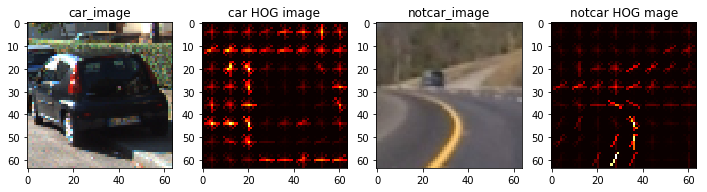

In [12]:
# Uncomment following line in Jupyter Notebook
%matplotlib inline
# %matplotlib qt

# Choose randome car / not-car indices
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

# Define feature parameters
color_space = 'RGB'  # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 6  # HOG orientation angles
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0  # aka 1st feature channel. Can be 0, 1, 2, or "ALL"
# hog_channel = "ALL"  # aka 1st feature channel. Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)  # Spatial binning dimensions
hist_bins = 16  # Number of histogram bins
spatial_feat = True  # Spatial features on or off
hist_feat = True  # Histogram features on or off
hog_feat = True  # HOG features on or off

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                                                  hist_bins=hist_bins, orient=orient,
                                                  pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,hog_channel=hog_channel,
                                                  spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat,
                                                  vis=True)
notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size,
                                                  hist_bins=hist_bins, orient=orient,
                                                  pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,hog_channel=hog_channel,
                                                  spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat,
                                                  vis=True)

images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car_image', 'car HOG image', 'notcar_image', 'notcar HOG mage']
fig = plt.figure(figsize=(12,3))  #, dpi=80)
visualize(1, 4, images, titles)


### 1.2. Train Linear SVM Classifier

#### Split Out Training / Testing Image Datasets

In [13]:
# Training the Classifier

# Define feature parameters
color_space = 'YCrCb'  # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
# Train 1 RGB, orient=6, hog_channel=0, spatial_size=(16, 16), hist_bins=16 : Test Accuracy == 0.97
# Train 2 YCrCb, orient=6, hog_channel=0, spatial_size=(16, 16), hist_bins=16 : Test Accuracy == 0.96
# Train 3 YCrCb, orient=9, hog_channel=0, spatial_size=(16, 16), hist_bins=16 : Test Accuracy == 0.975
# Train 4 YCrCb, orient=9, hog_channel="ALL", spatial_size=(16, 16), hist_bins=16 : Test Accuracy == 0.985
# Train 5 YCrCb, orient=9, hog_channel="ALL", spatial_size=(32, 32), hist_bins=32 : Test Accuracy == 0.995
orient = 9  # HOG orientation angles
pix_per_cell = 8
cell_per_block = 2
hog_channel = "ALL"  # aka 1st feature channel. Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32)  # Spatial binning dimensions
hist_bins = 32  # Number of histogram bins
spatial_feat = True  # Spatial features on or off
hist_feat = True  # Histogram features on or off
hog_feat = True  # HOG features on or off

t = time.time()
n_samples = 1000
random_idxs = np.random.randint(0, len(cars), n_samples)
# test_cars = np.array(cars)[random_idxs]  # Train on only random 1000 images. Takes ~=10 seconds.
test_cars = cars  # Trains on all available data. Takes along time!
# test_notcars = np.array(notcars)[random_idxs]  # Train on only random 1000 images. Takes ~=10 seconds.
test_notcars = notcars  # Trains on all available data. Takes along time!

car_features = extract_features(test_cars, color_space=color_space, spatial_size=spatial_size,
                                hist_bins=hist_bins, orient=orient,
                                pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                                hog_channel=hog_channel,
                                spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(test_notcars, color_space=color_space, spatial_size=spatial_size,
                                   hist_bins=hist_bins, orient=orient,
                                   pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                                   hog_channel=hog_channel,
                                   spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)

print(time.time() - t, 'Seconds to compute features ...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomised training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.1, random_state=rand_state)

print('Using :', orient, 'orientations,', pix_per_cell, 'pixels per cell,', cell_per_block, 'cells per block,',
      hist_bins, 'histogram bins, and', spatial_size, 'spatial sampling')

print('Feature vector length :', len(X_train[0]))

# Use a linear SVC
svc = LinearSVC()

# Check the training time for the SVC
t = time.time()
svc.fit(X_train, y_train)

print(round(time.time() - t, 2), 'Seconds to train SVC ...')

# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))


56.488849401474 Seconds to compute features ...
Using : 9 orientations, 8 pixels per cell, 2 cells per block, 32 histogram bins, and (32, 32) spatial sampling
Feature vector length : 8460
5.57 Seconds to train SVC ...
Test Accuracy of SVC =  0.9938


In [14]:
# Save Linear SVC Classifier
dist_pickle = {}
dist_pickle['svc'] = svc
dist_pickle['X_scaler'] = X_scaler
dist_pickle['orient'] = orient
dist_pickle['pix_per_cell'] = pix_per_cell
dist_pickle['cell_per_block'] = cell_per_block
dist_pickle['spatial_size'] = spatial_size
dist_pickle['hist_bins'] = hist_bins
pickle.dump(dist_pickle, open("svc_pickle.p", "wb"))


0.0 1.0
0.3239786624908447 seconds to process one image searching 100 windows
0.0 1.0
0.30123353004455566 seconds to process one image searching 100 windows
0.0 1.0
0.2997415065765381 seconds to process one image searching 100 windows
0.0 1.0
0.30255889892578125 seconds to process one image searching 100 windows
0.0 1.0
0.2985973358154297 seconds to process one image searching 100 windows
0.0 1.0
0.2973930835723877 seconds to process one image searching 100 windows


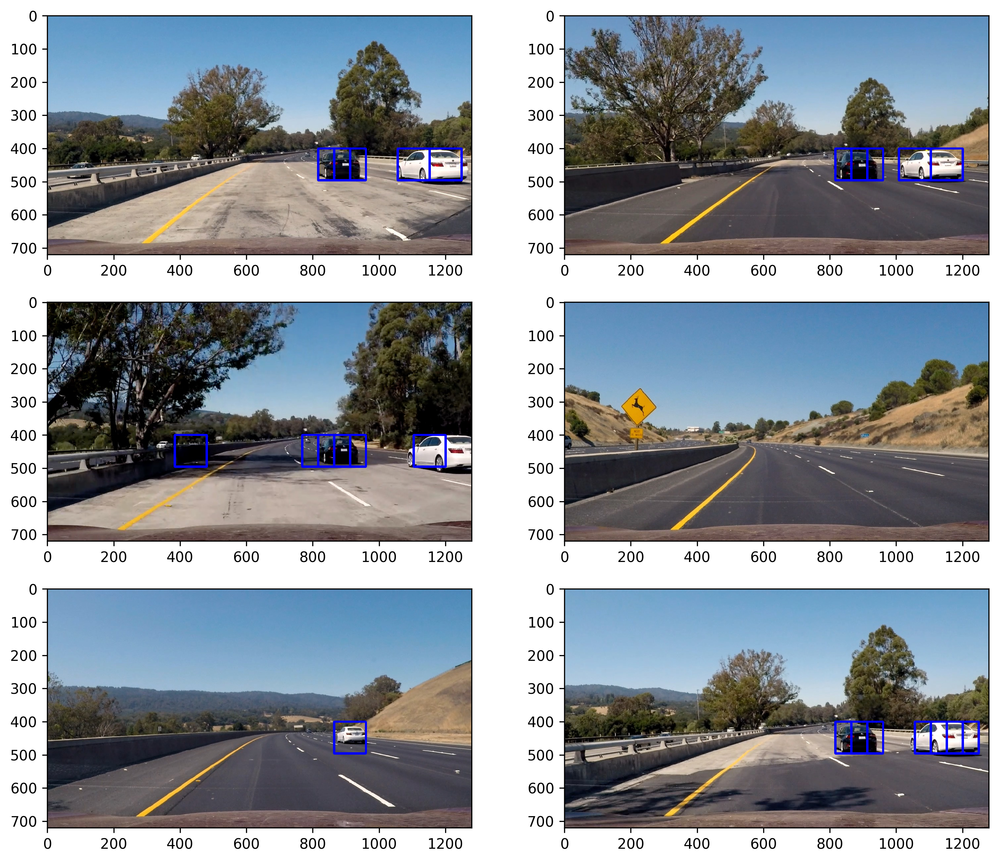

In [15]:
searchpath = 'CarND-Vehicle-Detection-master/test_images/*'
example_images = glob.glob(searchpath)
images = []
titles = []
# y_start_stop = [None, None]  # Min and max in y to search in slide_window(). Trees tops caused false positives
y_start_stop = [400, 656]  # Min and max in y to search in slide_window(). Trees tops caused false positives
overlap = 0.5  # 50% overlap
for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    img = img.astype(
        np.float32) / 255  # IMPORTANT : reading *.jpeg's (scaled 0-255), but trained on *.png's (scaled 0-1)
    print(np.min(img), np.max(img))

    # windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop,
    #                        xy_window=(128, 128), xy_overlap=(overlap, overlap))  # Missed detecting some cars
    # windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop,
    #                        xy_window=(64, 64), xy_overlap=(overlap, overlap))  # Missed larger cars.
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop,
                           xy_window=(96, 96), xy_overlap=(overlap, overlap))

    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space,
                                 spatial_size=spatial_size, hist_bins=hist_bins,
                                 orient=orient, pix_per_cell=pix_per_cell,
                                 cell_per_block=cell_per_block,
                                 hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat,
                                 hog_feat=hog_feat)

    window_img = draw_boxes(draw_img, hot_windows, color=(0, 0, 255), thick=6)
    images.append(window_img)
    titles.append('')
    print(time.time() - t1, 'seconds to process one image searching', len(windows), 'windows')

fig = plt.figure(figsize=(12, 18), dpi=300)
visualize(5, 2, images, titles)


In [16]:
def convert_color(img, conv='RGB2YCrCb'):
    """
    Call various cv2 image space conversions
    :param img: to convert from
    :param conv: space to convert to
    :return: extracted image space
    """
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)



#### 3.1. Tracking Pipeline Algorithm

0.25640416145324707 seconds to run, total windows =  294
0.23745989799499512 seconds to run, total windows =  294
0.2357654571533203 seconds to run, total windows =  294
0.24193191528320312 seconds to run, total windows =  294
0.26677584648132324 seconds to run, total windows =  294
0.2356419563293457 seconds to run, total windows =  294


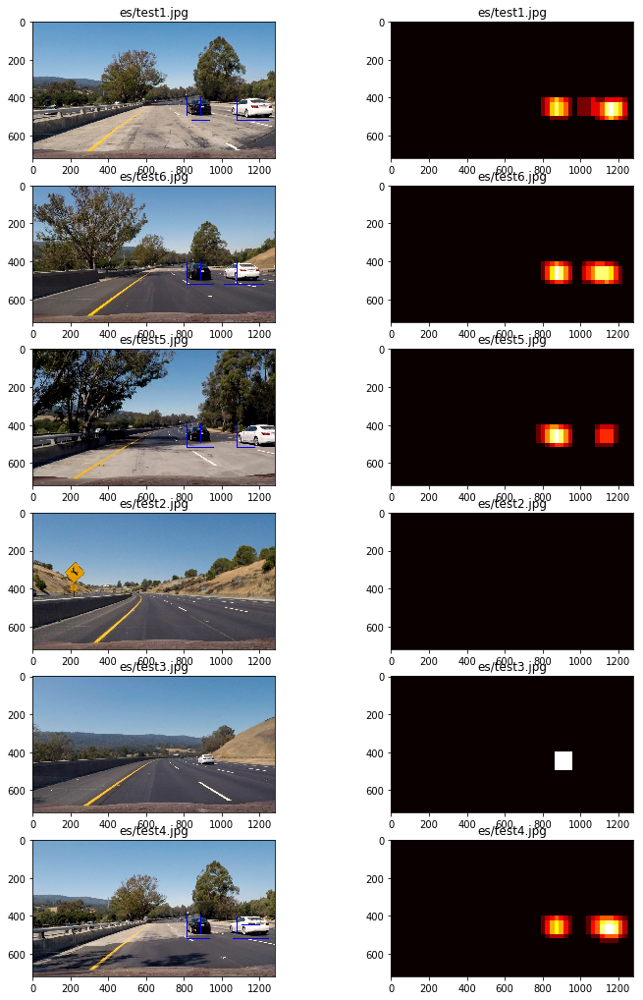

In [17]:
out_images = []
out_maps = []
out_titles = []
out_boxes = []

# Consider a narrower swath in y
ystart = 400
ystop = 656
# scale = 1  # scale entire image, apply HOG to entire image
scale = 1.5

# Iterate over test images
for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)

    # Make a heatmap of zeros
    heatmap = np.zeros_like(img[:, :, 0])
    img = img.astype(np.float32) / 255

    img_tosearch = img[ystart:ystop, :, :]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')

    if scale != 1:  # resize whole image instead of separate windows
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1] / scale), np.int(imshape[0] / scale)))

    ch1 = ctrans_tosearch[:, :, 0]
    ch2 = ctrans_tosearch[:, :, 1]
    ch3 = ctrans_tosearch[:, :, 2]

    # Define blocks and steps as above
    # These hold the number of HOG cells
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1  # Note : '//' causes integers to be result, instead of floats
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    # How many features per block are we going to be extracting
    nfeat_per_block = orient * cell_per_block ** 2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    # aka 75% overlap between cells
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step

    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)

    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb * cells_per_step
            xpos = xb * cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop + window, xleft:xleft + window], (64, 64))

            # Get colour features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(
                np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict((test_features))

            if test_prediction == 1:
                xbox_left = np.int(xleft * scale)
                ytop_draw = np.int(ytop * scale)
                win_draw = np.int(window * scale)
                cv2.rectangle(draw_img, (xbox_left, ytop_draw + ystart),
                              (xbox_left + win_draw, ytop_draw + win_draw + ystart), (0, 0, 255))
                img_boxes.append(
                    ((xbox_left, ytop_draw + ystart), (xbox_left + win_draw, ytop_draw + win_draw + ystart)))
                heatmap[ytop_draw + ystart:ytop_draw + win_draw + ystart, xbox_left:xbox_left + win_draw] += 1

    print(time.time() - t, 'seconds to run, total windows = ', count)

    out_images.append(draw_img)

    out_titles.append(img_src[-12:])
    out_titles.append(img_src[-12:])

    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)

fig = plt.figure(figsize=(12, 24))
visualize(8, 2, out_images, out_titles)


In [31]:
# Set Region Of Interest and Scale window inspection technique.
ystart = 400
ystop = 656
scale = 1.5

# Load Linear SVC Classifier
dist_pickle = pickle.load(open("svc_pickle.p", "rb"))
svc = dist_pickle["svc"]
X_scaler = dist_pickle["X_scaler"]
orient = dist_pickle["orient"]
pix_per_cell = dist_pickle["pix_per_cell"]
cell_per_block = dist_pickle["cell_per_block"]
spatial_size = dist_pickle["spatial_size"]
hist_bins = dist_pickle["hist_bins"]


In [32]:
# Iterate over test images
def find_cars(img, scale):
    """
    Find cars either in individual windows or across the entire image if scale != 1.
    :param img: image (or individual windows) to apply Classifier on
    :param scale: 1 == classify on windows, 1 < scale > 1 == classify on entire image
    :return: drawn on image, detection boxes and heatmaps
    """
    img_boxes = []  # Clears img_boxes so we don't keep unwanted heatmap history
    count = 0
    draw_img = np.copy(img)

    # Make a heatmap of zeros
    heatmap = np.zeros_like(img[:, :, 0])
    img = img.astype(np.float32) / 255

    img_tosearch = img[ystart:ystop, :, :]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')

    if scale != 1:  # resize whole image instead of separate windows
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1] / scale), np.int(imshape[0] / scale)))

    ch1 = ctrans_tosearch[:, :, 0]
    ch2 = ctrans_tosearch[:, :, 1]
    ch3 = ctrans_tosearch[:, :, 2]

    # Define blocks and steps as above
    # These hold the number of HOG cells
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1  # Note : '//' causes integers to be result, instead of floats
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    # How many features per block are we going to be extracting
    nfeat_per_block = orient * cell_per_block ** 2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    # aka 75% overlap between cells
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step

    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)

    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb * cells_per_step
            xpos = xb * cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop + window, xleft:xleft + window], (64, 64))

            # Get colour features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(
                np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict((test_features))

            if test_prediction == 1:
                xbox_left = np.int(xleft * scale)
                ytop_draw = np.int(ytop * scale)
                win_draw = np.int(window * scale)
                cv2.rectangle(draw_img, (xbox_left, ytop_draw + ystart),
                              (xbox_left + win_draw, ytop_draw + win_draw + ystart), (0, 0, 255))
                img_boxes.append(
                    ((xbox_left, ytop_draw + ystart), (xbox_left + win_draw, ytop_draw + win_draw + ystart)))
                heatmap[ytop_draw + ystart:ytop_draw + win_draw + ystart, xbox_left:xbox_left + win_draw] += 1

    return draw_img, img_boxes, heatmap



In [33]:
from scipy.ndimage.measurements import label

In [34]:
def apply_threshold(heatmap, threshold):
    """
    Remove false-positive detections by replacing pixel values with 0 if fall below threshold
    :param heatmap: detections
    :param threshold: to trigger setting 0 value
    :return: heatmap with false-positive car detections removed (hopefully)
    """
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap



In [35]:
def draw_labeled_bboxes(img, labels):
    """
    Draw bounding box around detected cars in image.
    :param img: to draw rectangles on detected cars
    :param labels: detected cars
    :return: drawn on image
    """
    # Iterate through all detected cards
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img



### 5.0. Detected Bounding Box

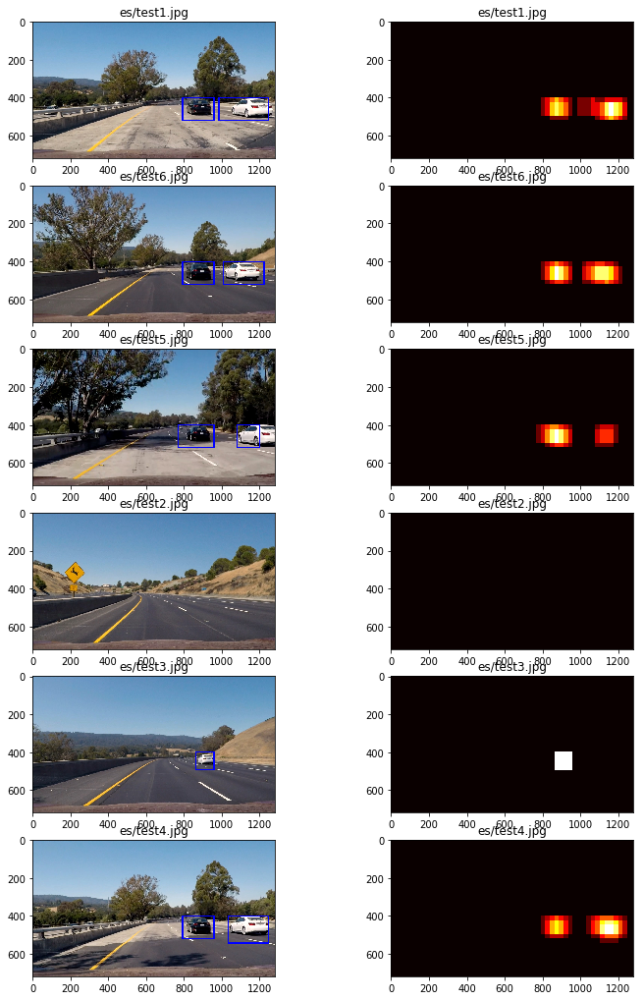

In [59]:
out_images = []
out_maps = []
scale = 1.5
# Iterate over test images
for img_src in example_images:
    img = mpimg.imread(img_src)
    out_img, out_boxes, heat_map = find_cars(img, scale)
    labels = label(heat_map)
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    out_images.append(draw_img)
    out_images.append(heat_map)
    
fig = plt.figure(figsize=(12,24))
visualize(8, 2, out_images, out_titles)

# save pickle
dist_pickle = out_boxes
pickle.dump( dist_pickle, open("bbox_pickle.p", "wb" ) )


In [37]:
def add_heat(heatmap, bbox_list):
    """
    Create heatmap in bounding boxes
    :param heatmap: of detections
    :param bbox_list: bounding boxes
    :return: updated heatmap
    """
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap  # Iterate through list of bboxes



In [38]:
def apply_threshold(heatmap, threshold):
    """
    Remove false-positive detections by replacing pixel values with 0 if fall below threshold
    :param heatmap: detections
    :param threshold: to trigger setting 0 value
    :return: heatmap with false-positive car detections removed (hopefully)
    """
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap



In [39]:
def draw_labeled_bboxes(img, labels):
    """
    Draw bounding box around detected cars in image.
    :param img: to draw rectangles on detected cars
    :param labels: detected cars
    :return: drawn on image
    """
    # Iterate through all detected cars
    for car_number in range(1, labels[1] + 1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0, 0, 255), 6)
    # Return the image
    return img



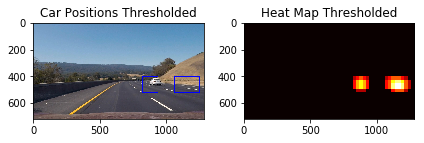

In [40]:
# Read in a pickle file with bboxes saved
# Each item in the "all_bboxes" list will contain a
# list of boxes for one of the images shown above
box_list = pickle.load(open("bbox_pickle.p", "rb"))

# Read in image similar to one shown above
image = mpimg.imread('CarND-Vehicle-Detection-master/test_images/test3.jpg')
heat = np.zeros_like(image[:, :, 0]).astype(np.float)

# Add heat to each box in box list
heat = add_heat(heat, box_list)

# Apply threshold to help remove false positives
heat = apply_threshold(heat, 1)  # shows far-left + far-right false positives
# heat = apply_threshold(heat, 2)  # shows          far-right false positive
# heat = apply_threshold(heat, 57)  # shows                no false positives, but unacceptable bounding box!

# Visualize the heatmap when displaying
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)

fig = plt.figure()
plt.subplot(121)
plt.imshow(draw_img)
plt.title('Car Positions Thresholded')
plt.subplot(122)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map Thresholded')
fig.tight_layout()


In [41]:
# TODO
# Instead of just processing single frames like above, in the project you really want to integrate that heatmap
# over 5 to 10 frames and then the cars should stand out brightly against a background of a few false-positives
# and you can then threshold that and get a nice clean box around actual cars and reject false-positives



### 4.0. Video Heat Map

In [55]:
def process_image(img):
    """
    Image processing pipeline called during video stream of frames
    :param img: frame from video
    :return: image with heatmap and bounding box detections
    """
    #global avg_heat
    avg_heat=np.zeros_like(image[:, :, 0]).astype(np.float)
    out_img, out_boxes, heat_map = find_cars(img, scale)

    # -----
    heat = np.zeros_like(image[:, :, 0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat, out_boxes)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, 1)
    # heat = apply_threshold(heat, 2)

    avg_heat = cv2.addWeighted(avg_heat, 0.8, heat, 0.2, 0.)

    # Apply threshold to help remove near-zero noise
    heatmap = apply_threshold(cv2.blur(avg_heat, (15, 15)), 0.5)

    # Visualize the heatmap when displaying
    heatmap = np.clip(heatmap, 0, 255)  # limit the values in the heatmap array

    # -----
    # Find final boxes from heatmap using label function
    labels = label(heat_map)
    # Draw bounding boxes on a copy of the image
    output_img = draw_labeled_bboxes(np.copy(img), labels)

    # -----
    r = 377.0 / avg_heat.shape[1]  # calculate height
    dim = (377, int(avg_heat.shape[0] * r))  # width, height
    resized = cv2.resize(avg_heat, dim, interpolation=cv2.INTER_AREA)
    # add to output_img
    output_img[0:0 + resized.shape[0], 0:0 + resized.shape[1]] = np.repeat(resized[:, :, np.newaxis], 3,
                                                                         axis=2) * 255
    output_img = cv2.putText(output_img, "Heatmap", (34, 34), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2,
                           cv2.LINE_AA)

    # -----
    return output_img



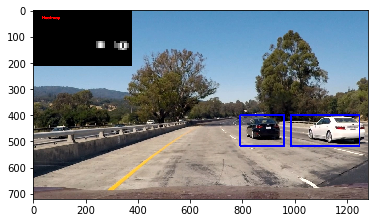

In [56]:
# Add Heatmap indicator
img_test = mpimg.imread('CarND-Vehicle-Detection-master/test_images/test1.jpg')

output_process = process_image(img_test)
plt.imshow(output_process)


In [60]:
# Import everything needed to edit / save / watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# output = 'CarND-Vehicle-Detection-master/output_images/test_output_project_video.mp4'
output = 'CarND-Vehicle-Detection-master/output_images/final_output_project_video.mp4'
# clip = VideoFileClip("CarND-Vehicle-Detection-master/test_video.mp4")
clip = VideoFileClip("CarND-Vehicle-Detection-master/project_video.mp4")
test_clip = clip.fl_image(process_image)
# %time
test_clip.write_videofile(output, audio=False)


[MoviePy] >>>> Building video CarND-Vehicle-Detection-master/output_images/final_output_project_video.mp4
[MoviePy] Writing video CarND-Vehicle-Detection-master/output_images/final_output_project_video.mp4


100%|█████████▉| 1260/1261 [05:29<00:00,  3.90it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: CarND-Vehicle-Detection-master/output_images/final_output_project_video.mp4 



In [58]:
HTML("""
<video width="960" height="540" controls>
    <source src="{0}">
</video>
""".format(output))
